In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd 

In [2]:
def printImgs(images,lsNames,lsValPSNR, n=1, m=1, title='',k=0):
    
    images = images[:n*m]
    fig, axs = plt.subplots(
        nrows=n, ncols=m, 
        figsize=(15, 20), 
        subplot_kw={
            'xticks': [], 
            'yticks': []
        }
    )
    i=0
    for ax, image,lsName,lsval in zip(axs.flat, images,lsNames,lsValPSNR):
        ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        ax.set_title(lsName)
        if i>k:
            ax.set_xlabel(str("{:.3f}".format(lsval)),fontsize=14)
        i=i+1    
    plt.savefig(title)    
    plt.show()


def printGrafs(images, n=1, m=1, title=''):
    
    images = images[:n*m]
    fig, axs = plt.subplots(
        nrows=n, ncols=m, 
        figsize=(18, 20), 
        subplot_kw={
            'xticks': [], 
            'yticks': []
        }
    )
    for ax, image in zip(axs.flat, images):
        ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.savefig(title)    
    plt.show()

In [3]:
### DIP - VTV - GradRimm - Dirac
lsNumPrue = ['340','342','350','341B']
lambAsLS = ['0','0.0001','0.0001','0.0001']
typeP = 'debU'

kodim_num_i = 19

In [4]:
lsBestImg = []
    
ruta = './IMGkodim'+ str(kodim_num_i) +'/'

#original
namefig = './deblurring/kodim'+ str(kodim_num_i) + '_small.png'
imgOut = cv2.imread(namefig)
lsBestImg.append(imgOut)
filename = ruta + 'kodim'+ str(kodim_num_i) +'_small.png'
cv2.imwrite(filename, imgOut)

#denoisig25
namefig = './deblurring/kodim'+ str(kodim_num_i) + '_small_blurred_uniform.png'
imgOut = cv2.imread(namefig)
lsBestImg.append(imgOut)
filename = ruta + 'kodim'+ str(kodim_num_i) + '_small_blurred_uniform.png'
cv2.imwrite(filename, imgOut)

for Nprueb,lambAs in zip(lsNumPrue,lambAsLS):
    
    ruta = './'+ Nprueb +'/BestPnsr'+ typeP + '_P'+ Nprueb +'lamb'+ lambAs +'/'
    namefig = ruta + 'BestPnsr'+ typeP +'_P'+ Nprueb +'_'+ lambAs + 'kodim'+ str(kodim_num_i) +'_small.png'
    imgOut = cv2.imread(namefig)
    lsBestImg.append(imgOut)
    
    filename = ruta + 'BestIMGP'+ Nprueb +'_'+ lambAs + 'kodim'+ str(kodim_num_i) +'.png'
    cv2.imwrite(filename, imgOut)

In [5]:
filename

'./341B/BestPnsrdebU_P341Blamb0.0001/BestIMGP341B_0.0001kodim19.png'

In [6]:
imgOut.shape

(384, 256, 3)

In [7]:
namefig

'./341B/BestPnsrdebU_P341Blamb0.0001/BestPnsrdebU_P341B_0.0001kodim19_small.png'

In [8]:
#BestPnsrdebU_P350_0.0001kodim19_small

In [9]:
lsNames = ['Downsampling','Downsampling + Blur','DIP', 'DIP-VTV',' DIP-RiemannVTV', 'DIP-DiracVTV$^{NL}$']

In [10]:
from skimage.metrics import peak_signal_noise_ratio as compare_psnr

lsValPSNR = []

for i in range(6):
    val = compare_psnr(lsBestImg[0],lsBestImg[i])
    lsValPSNR.append(val)

/home/linux21/miniconda3/lib/python3.10/site-packages/skimage/metrics/simple_metrics.py:163: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


In [11]:
print(lsValPSNR[1:])
print(max(lsValPSNR[1:]))
print(np.argmax(lsValPSNR[1:])+1)

[21.854736164686656, 28.243259367399638, 29.10663608463677, 29.30147320445183, 29.39457284538832]
29.39457284538832
5


In [12]:
lsValPSNR

[inf,
 21.854736164686656,
 28.243259367399638,
 29.10663608463677,
 29.30147320445183,
 29.39457284538832]

In [13]:
#round(np.array(lsValPSNR),3)
num="{:.2f}".format(lsValPSNR[0])

In [14]:
lsValPSNR[0] = 0

In [15]:
#lsValPSNR = [' ','20.321','28,247','29,111','29,306','29,400']

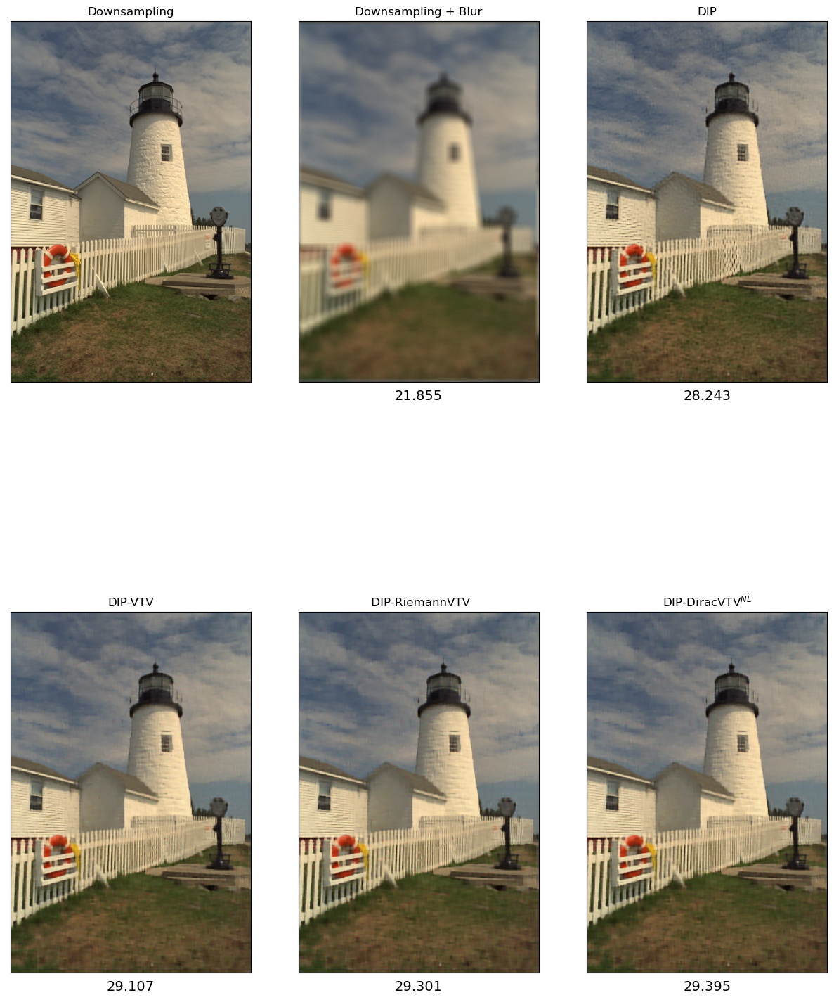

In [16]:
titulo = 'ComImg'+typeP +'KODIMnum' + str(kodim_num_i) + '.png'
printImgs(lsBestImg,lsNames,lsValPSNR, 2, 3, titulo)

In [17]:
lsImgDif = []
lsGris = []
for i in range(6):
    imgDif = lsBestImg[0] - lsBestImg[i]
    lsImgDif.append(imgDif)
    
    ImgGris = cv2.cvtColor(imgDif, cv2.COLOR_BGR2GRAY)
    lsGris.append(ImgGris)

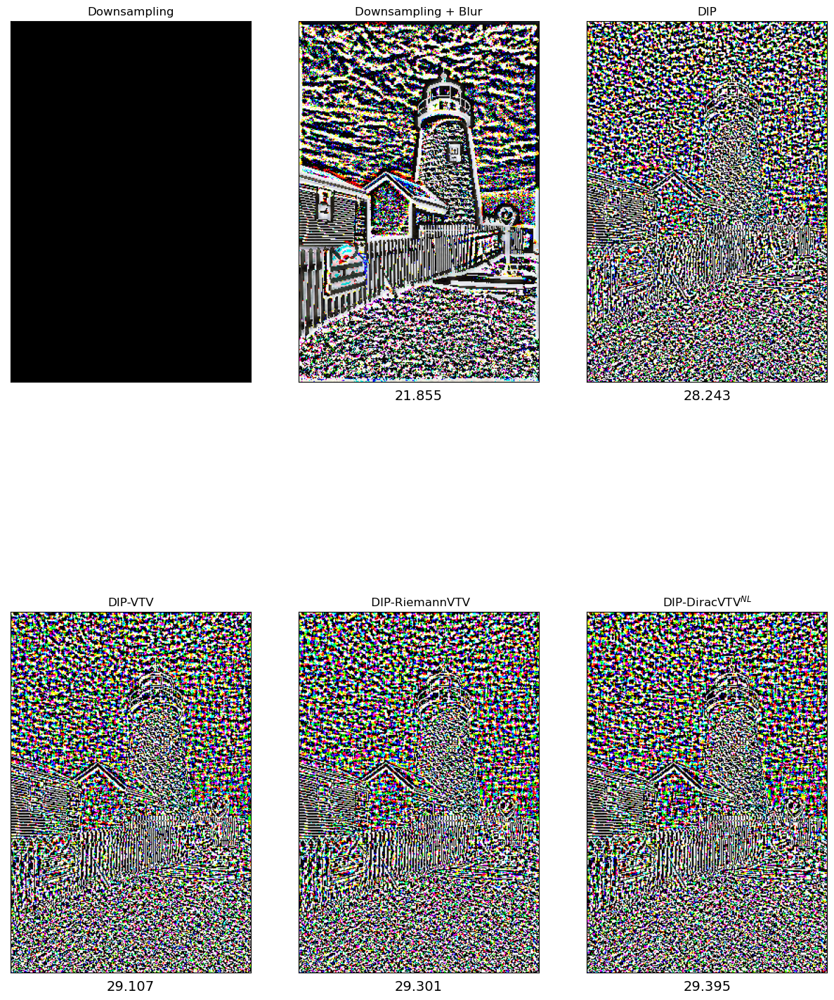

In [18]:
titulo = 'ComImgDifColor'+typeP +'KODIMnum' + str(kodim_num_i) + '.png'
printImgs(lsImgDif,lsNames,lsValPSNR , 2, 3, titulo)

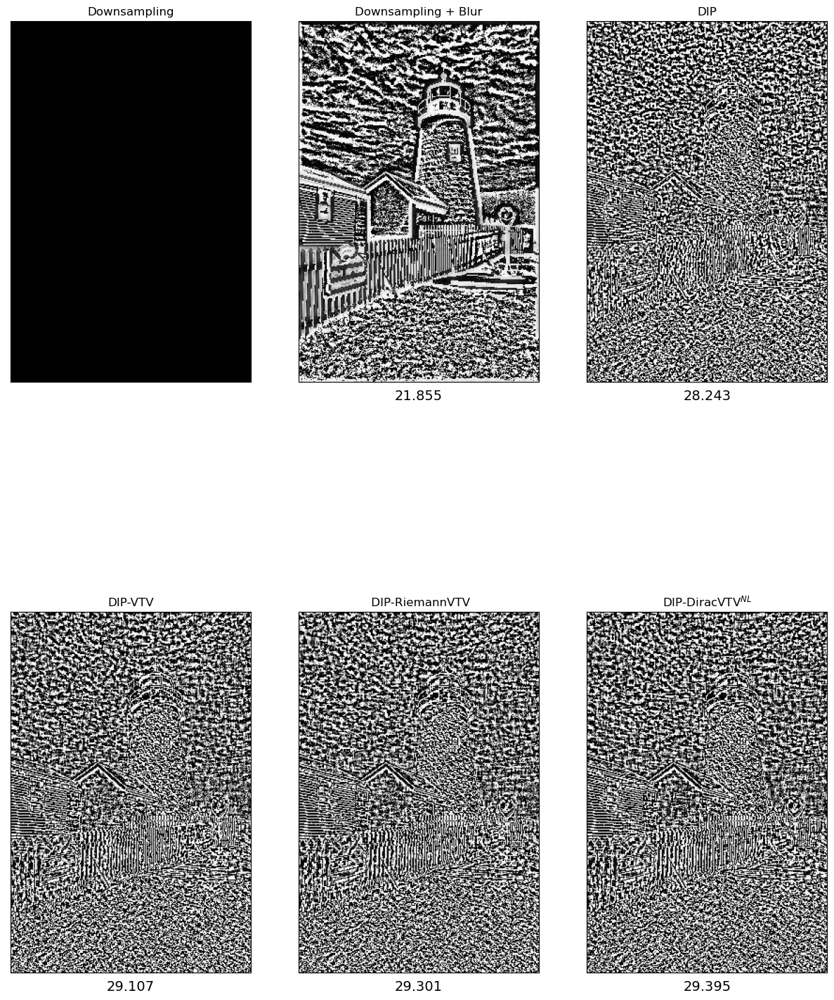

In [19]:
titulo = 'ComImgDifGris'+typeP +'KODIMnum' + str(kodim_num_i) + '.png'
printImgs(lsGris,lsNames,lsValPSNR, 2, 3, titulo)

In [20]:
lsValPSNR = []

for i in range(6):
    val = compare_psnr(lsBestImg[0],lsBestImg[i])
    lsValPSNR.append(val)

In [21]:
print(lsValPSNR[1:])
print(max(lsValPSNR[1:]))
print(np.argmax(lsValPSNR[1:])+1)

[21.854736164686656, 28.243259367399638, 29.10663608463677, 29.30147320445183, 29.39457284538832]
29.39457284538832
5


In [22]:
(a_y,a_x) = (280,100)
(b_y,b_x) = (380,220)
(c_y,c_x) = (50,400)
(d_y,d_x) = (150,550)

In [23]:
(a_y,a_x) = (a_y//2,a_x//2)
(b_y,b_x) = (b_y//2,b_x//2) 
(c_y,c_x) = (c_y//2,c_x//2)
(d_y,d_x) = (d_y//2,d_x//2)

In [24]:
lsBestImg[0].shape

(384, 256, 3)

In [25]:
lsImgRec =[]
lscrtG =[]
lscrtR =[]

for i in range(len(lsBestImg)):
    imgRec = lsBestImg[i].copy()
    rec1 = cv2.rectangle(imgRec,(a_y,a_x),(b_y,b_x),(0,255,0),2)
    rec2 = cv2.rectangle(imgRec,(c_y,c_x),(d_y,d_x),(255,0,0),2)
    lsImgRec.append(imgRec)
    
    cort1G = imgRec[a_x+1:b_x,a_y+1:b_y,:].copy()
    lscrtG.append(cort1G)
    cort1R = imgRec[c_x+1:d_x,c_y+1:d_y,:].copy()
    lscrtR.append(cort1R)

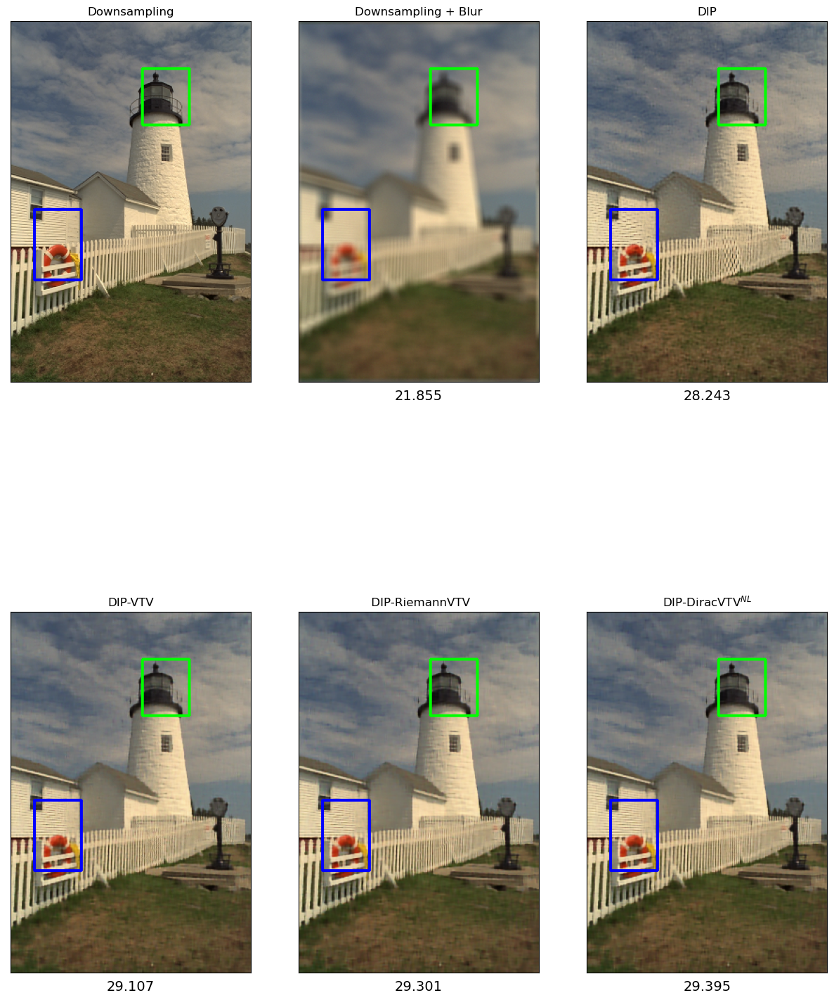

In [26]:
titulo = 'ComImgREC'+typeP +'KODIMnum' + str(kodim_num_i) + '.png'
printImgs(lsImgRec,lsNames,lsValPSNR, 2, 3, titulo)

In [27]:
lsValPSNR = []

for i in range(6):
    val = compare_psnr(lscrtG[0],lscrtG[i])
    lsValPSNR.append(val)


In [28]:
print(lsValPSNR[1:])
print(max(lsValPSNR[1:]))
print(np.argmax(lsValPSNR[1:])+1)

[22.8276058955069, 28.997779338425005, 29.339336162573254, 29.61081403166328, 29.66529023485264]
29.66529023485264
5


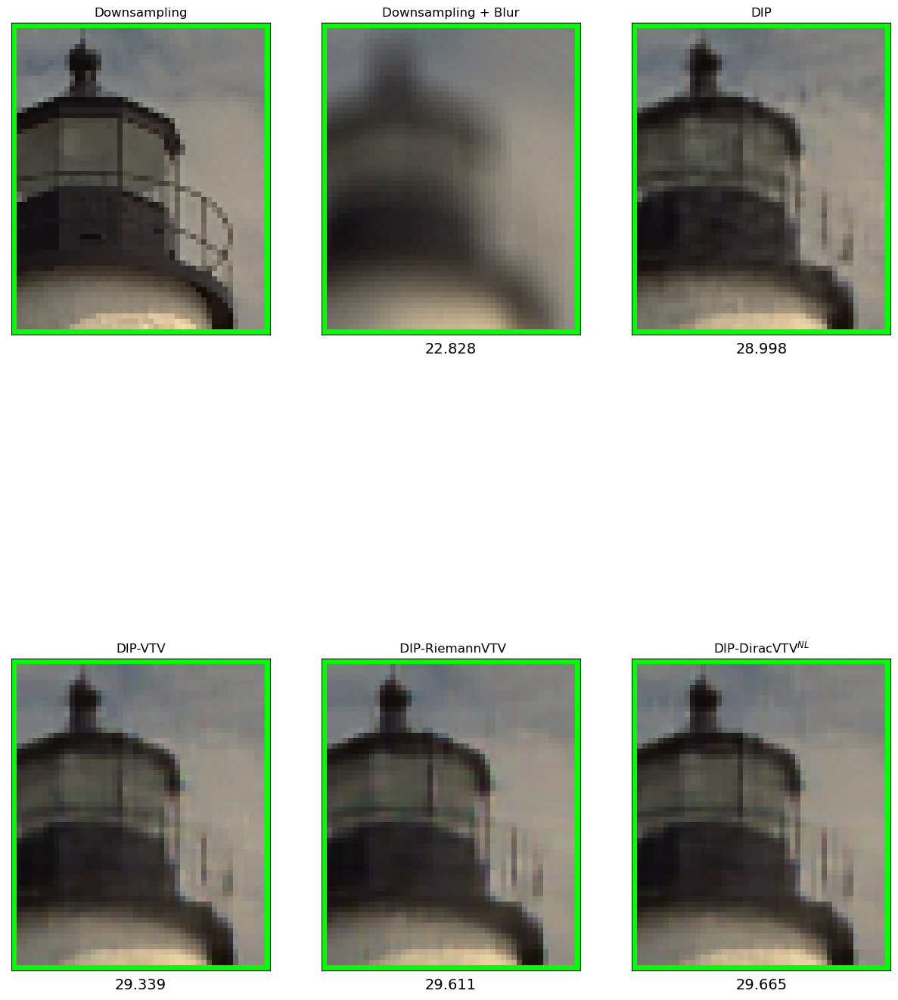

In [29]:
titulo = 'ComImgRectG'+typeP +'KODIMnum' + str(kodim_num_i) + '.png'

printImgs(lscrtG,lsNames,lsValPSNR, 2, 3, titulo)

In [30]:
lsValPSNR = []

for i in range(6):
    val = compare_psnr(lscrtR[0],lscrtR[i])
    lsValPSNR.append(val)

In [31]:
print(lsValPSNR[1:])
print(max(lsValPSNR[1:]))
print(np.argmax(lsValPSNR[1:])+1)

[17.532554439453556, 24.569240224385787, 25.677482964676233, 25.744364999585372, 25.969782933110647]
25.969782933110647
5


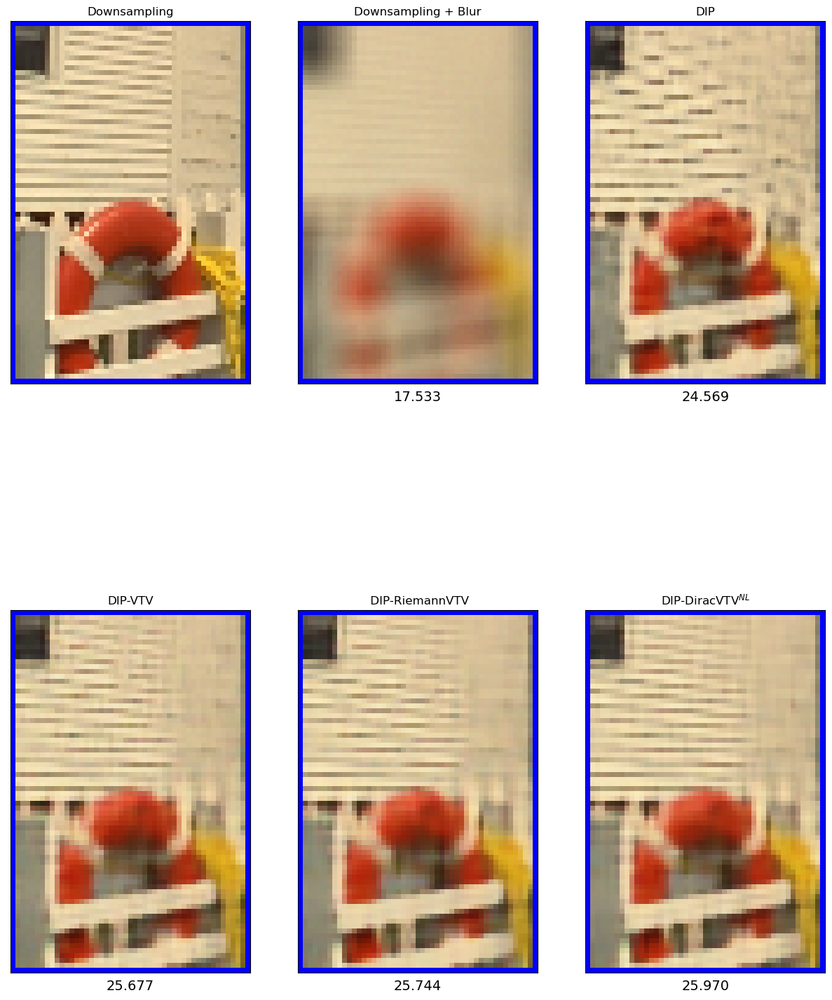

In [32]:
titulo = 'ComImgRectR'+typeP +'KODIMnum' + str(kodim_num_i) + '.png'

printImgs(lscrtR,lsNames,lsValPSNR, 2, 3, titulo)

In [33]:
imgDIP = lsBestImg[2].copy()#lscrtR[2].copy()

In [34]:
imgDIP.shape

(384, 256, 3)

In [35]:
derX = imgDIP[:,:-1,:] - imgDIP[:,1:,:]
derY = imgDIP[:-1,:,:] - imgDIP[1:,:,:]

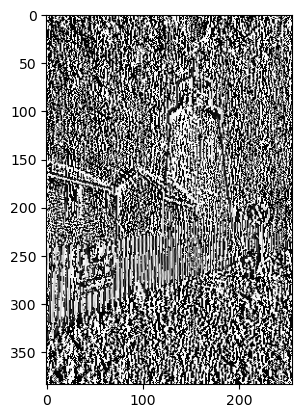

In [36]:
plt.imshow(derX[:,:,0], 'gray')

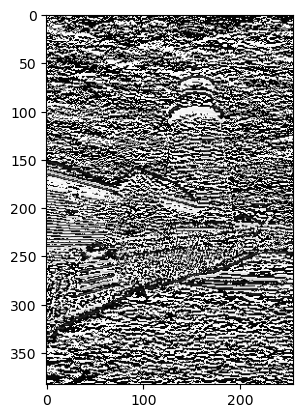

In [37]:
plt.imshow(derY[:,:,0], 'gray')

In [38]:
capa=0
i=25
j=45

(v1,v2)=(derX[i,j,capa],derY[i,j,capa])

In [39]:
(v1,v2)

(0, 3)

In [40]:
norm = np.sqrt(v1**2+v2**2)

In [41]:
(v1u,v2u) = (10*v1//norm,10*v2//norm)

In [42]:
(v1u,v2u)

(0.0, 10.0)

In [43]:
imgOut = cv2.arrowedLine(imgDIP, (i, j), (int(i+v1u), int(j+v2u)), (0, 255, 0), 1, cv2.LINE_AA)

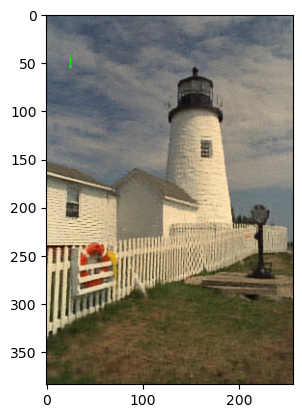

In [44]:
plt.imshow(cv2.cvtColor(imgDIP, cv2.COLOR_BGR2RGB))

In [45]:
#lsBestImg = lsImgVec.copy()

In [46]:
#PUNTO
#i=163
#j=120

i=321
j=48

def printVect(i,j,lsBestImg):
    lsImgVec = []

    color = [(255,0,0),(0,255,0),(0,0,255)]
    fact=50

    for imgParche in lsBestImg:

        imgObj = imgParche.copy()
        derX = imgObj[:,:-1,:] - imgObj[:,1:,:]
        derY = imgObj[:-1,:,:] - imgObj[1:,:,:]

        for k in range(3):
            capa = k

            (v1,v2) = (derX[i,j,capa],derY[i,j,capa])
            norm = np.sqrt(v1**2+v2**2)
            (v1u,v2u) = (fact*v1//norm,fact*v2//norm)
            imgOut = cv2.arrowedLine(imgObj, (j,i), (int(j+v2u),int(i+v1u)), color[k], 2,  cv2.LINE_AA)#, 0, 0.5)#cv2.LINE_4)#
            print((i, j), (int(i+v1u), int(j+v2u)))

        lsImgVec.append(imgObj)
    return lsImgVec

In [47]:
lsImgVec = printVect(163,120,lsBestImg)

(163, 120) (163, 170)
(163, 120) (212, 120)
(163, 120) (212, 120)
(163, 120) (203, 150)
(163, 120) (195, 158)
(163, 120) (198, 155)
(163, 120) (163, 169)
(163, 120) (163, 169)
(163, 120) (210, 135)
(163, 120) (163, 169)
(163, 120) (163, 170)
(163, 120) (185, 164)
(163, 120) (163, 169)
(163, 120) (176, 168)
(163, 120) (212, 122)
(163, 120) (164, 169)
(163, 120) (164, 169)
(163, 120) (172, 169)


In [48]:
DICT = [(75,184),(284,101),(201,22)]

for (x,y) in DICT[1:]:
    lsImgVec = printVect(x,y,lsImgVec)

(284, 101) (286, 150)
(284, 101) (287, 150)
(284, 101) (288, 150)
(284, 101) (302, 147)
(284, 101) (292, 150)
(284, 101) (292, 150)
(284, 101) (333, 104)
(284, 101) (333, 103)
(284, 101) (333, 107)
(284, 101) (334, 101)
(284, 101) (333, 104)
(284, 101) (333, 110)
(284, 101) (333, 108)
(284, 101) (332, 111)
(284, 101) (332, 112)
(284, 101) (333, 106)
(284, 101) (333, 109)
(284, 101) (332, 111)
(201, 22) (202, 71)
(201, 22) (202, 71)
(201, 22) (202, 71)
(201, 22) (250, 29)
(201, 22) (203, 71)
(201, 22) (250, 27)
(201, 22) (237, 56)
(201, 22) (237, 56)
(201, 22) (201, 71)
(201, 22) (201, 71)
(201, 22) (202, 71)
(201, 22) (203, 71)
(201, 22) (202, 71)
(201, 22) (202, 71)
(201, 22) (202, 71)
(201, 22) (201, 71)
(201, 22) (201, 71)
(201, 22) (201, 71)


In [49]:
lsImgVec = printVect(163,120,lsBestImg)
lsImgVec = printVect(284,101,lsImgVec)

(163, 120) (163, 170)
(163, 120) (212, 120)
(163, 120) (212, 120)
(163, 120) (203, 150)
(163, 120) (195, 158)
(163, 120) (198, 155)
(163, 120) (163, 169)
(163, 120) (163, 169)
(163, 120) (210, 135)
(163, 120) (163, 169)
(163, 120) (163, 170)
(163, 120) (185, 164)
(163, 120) (163, 169)
(163, 120) (176, 168)
(163, 120) (212, 122)
(163, 120) (164, 169)
(163, 120) (164, 169)
(163, 120) (172, 169)
(284, 101) (286, 150)
(284, 101) (287, 150)
(284, 101) (288, 150)
(284, 101) (302, 147)
(284, 101) (292, 150)
(284, 101) (292, 150)
(284, 101) (333, 104)
(284, 101) (333, 103)
(284, 101) (333, 107)
(284, 101) (334, 101)
(284, 101) (333, 104)
(284, 101) (333, 110)
(284, 101) (333, 108)
(284, 101) (332, 111)
(284, 101) (332, 112)
(284, 101) (333, 106)
(284, 101) (333, 109)
(284, 101) (332, 111)


In [50]:
lsImgVec = lsBestImg.copy()

In [51]:
import random
DICT = [(163,120),(196, 62),(231, 196), (291, 156)]#,(284,101), (144, 296)
#[(231, 196), (67, 71), (291, 156), (14, 63), (194, 174), (281, 59),(145, 139)]
ls = []
for i in range(6):
    x = random.randint(0, 384)
    y = random.randint(0, 256)
    ls.append((x,y))
print(ls)
for (x,y) in DICT: #ls:#  
    lsImgVec = printVect(x,y,lsImgVec)

[(325, 57), (194, 29), (137, 93), (307, 238), (360, 84), (46, 168)]
(163, 120) (163, 170)
(163, 120) (212, 120)
(163, 120) (212, 120)
(163, 120) (203, 150)
(163, 120) (195, 158)
(163, 120) (198, 155)
(163, 120) (163, 169)
(163, 120) (163, 169)
(163, 120) (210, 135)
(163, 120) (163, 169)
(163, 120) (163, 170)
(163, 120) (185, 164)
(163, 120) (163, 169)
(163, 120) (176, 168)
(163, 120) (212, 122)
(163, 120) (164, 169)
(163, 120) (164, 169)
(163, 120) (172, 169)
(196, 62) (196, 112)
(196, 62) (231, 97)
(196, 62) (237, 89)
(196, 62) (227, 101)
(196, 62) (196, 111)
(196, 62) (231, 97)
(196, 62) (198, 111)
(196, 62) (199, 111)
(196, 62) (200, 111)
(196, 62) (246, 62)
(196, 62) (231, 97)
(196, 62) (197, 111)
(196, 62) (198, 111)
(196, 62) (199, 111)
(196, 62) (201, 111)
(196, 62) (197, 111)
(196, 62) (198, 111)
(196, 62) (199, 111)
(231, 196) (231, 246)
(231, 196) (280, 197)
(231, 196) (235, 245)
(231, 196) (266, 231)
(231, 196) (275, 218)
(231, 196) (281, 196)
(231, 196) (233, 245)
(231, 196

In [52]:
lsValPSNR = []

for i in range(6):
    val = compare_psnr(lsBestImg[0],lsBestImg[i])
    lsValPSNR.append(val)

In [53]:
print(lsValPSNR[1:])
print(max(lsValPSNR[1:]))
print(np.argmax(lsValPSNR[1:])+1)

[21.854736164686656, 28.243259367399638, 29.10663608463677, 29.30147320445183, 29.39457284538832]
29.39457284538832
5


In [54]:
#Original imagen Grande con vectores
namefig = 'GradidentesImagenOrg19.png'
imgOut = cv2.imread(namefig)

In [55]:
lsImg34 = [imgOut,imgOut] + lsImgVec

In [56]:
lsValPSNR2 = [0,0] + lsValPSNR
lsValPSNR2

[0,
 0,
 inf,
 21.854736164686656,
 28.243259367399638,
 29.10663608463677,
 29.30147320445183,
 29.39457284538832]

In [57]:
lsNames2 = ['-','Original','Downsampling','Downsampling + Blur','DIP', 'DIP-VTV',' DIP-RiemannVTV', 'DIP-DiracVTV$^{NL}$']

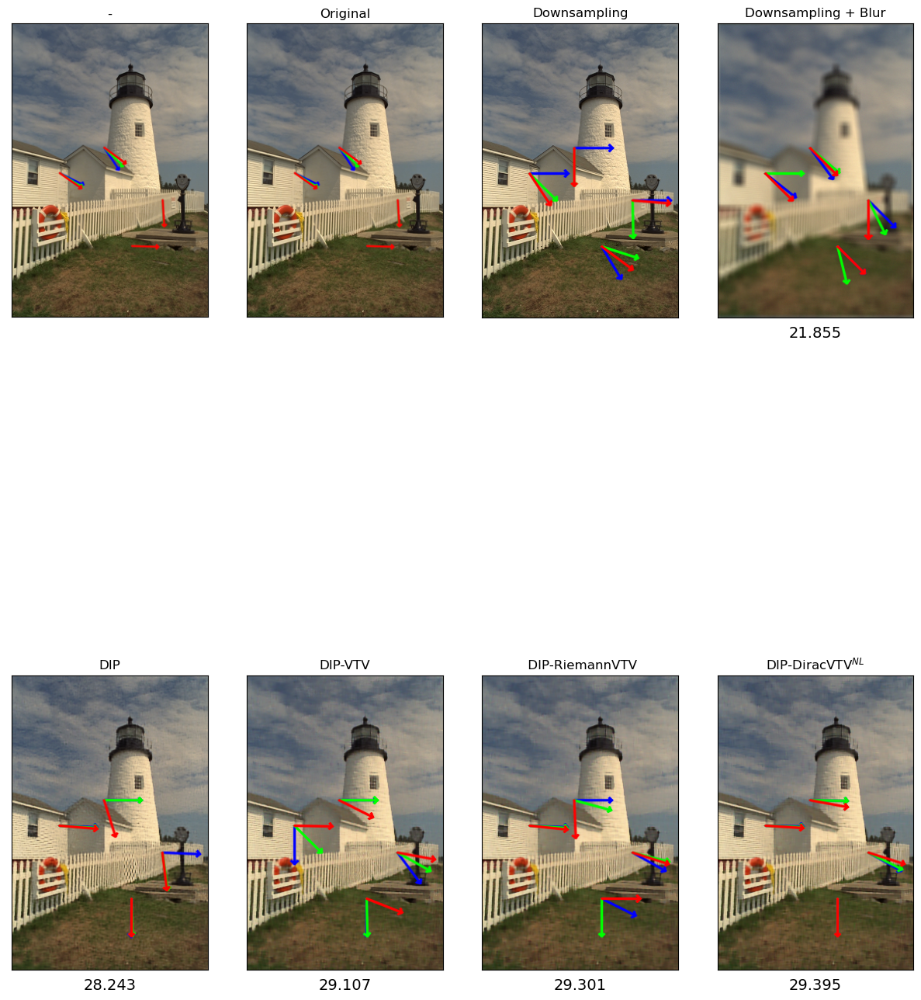

In [58]:
titulo = 'ComImgVect'+typeP +'KODIMnum' + str(kodim_num_i) + '.png'

#printImgs(lsImgVec[2:],lsNames[2:],lsValPSNR[2:], 1, 4, titulo)
printImgs(lsImg34,lsNames2,lsValPSNR2, 2, 4, titulo,2)

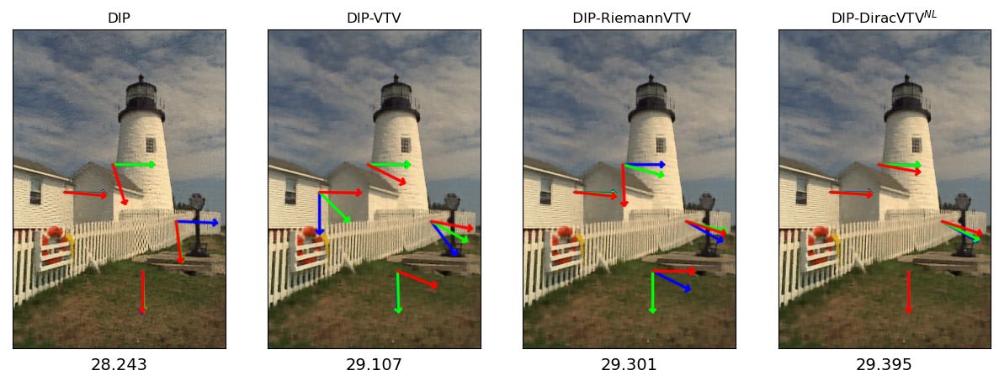

In [59]:
titulo = 'ComImgVectRedu'+typeP +'KODIMnum' + str(kodim_num_i) + '.png'

printImgs(lsImgVec[2:],lsNames[2:],lsValPSNR[2:], 1, 4, titulo,-1)

In [60]:
lsBestImg[0].shape

(384, 256, 3)

In [61]:
derX.shape

(384, 255, 3)

In [62]:
lsImgVec

[array([[[ 99,  94,  76],
         [107,  92,  77],
         [112,  97,  83],
         ...,
         [143, 140, 135],
         [143, 140, 132],
         [145, 142, 131]],
 
        [[101,  96,  81],
         [105,  90,  77],
         [109,  94,  80],
         ...,
         [136, 136, 131],
         [136, 135, 129],
         [137, 136, 128]],
 
        [[104, 100,  85],
         [106,  90,  77],
         [105,  91,  77],
         ...,
         [135, 132, 125],
         [136, 132, 127],
         [134, 135, 127]],
 
        ...,
 
        [[ 32,  64,  54],
         [ 25,  57,  46],
         [ 41,  75,  65],
         ...,
         [ 47,  70,  86],
         [ 48,  74,  90],
         [ 62,  89, 104]],
 
        [[ 37,  69,  58],
         [ 28,  64,  49],
         [ 27,  59,  48],
         ...,
         [ 60,  84, 101],
         [ 59,  82, 101],
         [ 63,  86, 102]],
 
        [[ 24,  63,  47],
         [ 31,  68,  53],
         [ 24,  55,  42],
         ...,
         [ 53,  78,  94],
  